# Homework #3

410485002 資工四 胡孝德

In [1]:
import jupyter_notebook
from Image_Processing.util import *
# https://notebooks.azure.com/shoulderhu/projects/ntpu/html/Image_Processing/util.ipynb

%matplotlib inline

importing Jupyter notebook from /home/nbuser/library/Image_Processing/util.ipynb


## Chapter 7 Exercises

1\. By hand, compute the DFT of each of the following sequences:  
Compare your answers with those given by your system's `fft` function

(a) [2, 3, 4, 5]

In [2]:
a1 = fft(array([2, 3, 4, 5]))
fftformat(a1)

 14.0000 +0.0000i
 -2.0000 +2.0000i
 -2.0000 +0.0000i
 -2.0000 -2.0000i


(b) [2, -3, 4, -5]

In [3]:
b1 = fft(array([2, -3, 4, -5]))
fftformat(b1)

 -2.0000 +0.0000i
 -2.0000 -2.0000i
 14.0000 +0.0000i
 -2.0000 +2.0000i


(c) [-9, -8, -7, -6] 

In [4]:
c1 = fft(array([-9, -8, -7, -6]))
fftformat(c1)

-30.0000 +0.0000i
 -2.0000 +2.0000i
 -2.0000 +0.0000i
 -2.0000 -2.0000i


(d) [-9, 8, -7, 6]

In [5]:
d1 = fft(array([-9, 8, -7, 6]))
fftformat(d1)

 -2.0000 +0.0000i
 -2.0000 -2.0000i
-30.0000 +0.0000i
 -2.0000 +2.0000i


2\. For each of the transforms you computed in the previous question, compute the inverse transform by hand.

(a)

In [6]:
a2 = ifft(a1)
fftformat(a2)

  2.0000 +0.0000i
  3.0000 +0.0000i
  4.0000 +0.0000i
  5.0000 +0.0000i


(b)

In [7]:
b2 = ifft(b1)
fftformat(b2)

  2.0000 +0.0000i
 -3.0000 +0.0000i
  4.0000 +0.0000i
 -5.0000 +0.0000i


(c)

In [8]:
c2 = ifft(c1)
fftformat(c2)

 -9.0000 +0.0000i
 -8.0000 +0.0000i
 -7.0000 +0.0000i
 -6.0000 +0.0000i


(d)

In [9]:
d2 = ifft(d1)
fftformat(d2)

 -9.0000 +0.0000i
  8.0000 +0.0000i
 -7.0000 +0.0000i
  6.0000 +0.0000i


7\. How do you think filtering with an averaging filter will effect the output of a Fourier Transformation?  
Compare the DFTs of the cameraman image, and of the image after filtering with a 5 x 5 averaging filter.  
Can you account for the result?  

因為取平均的關係，頻率也跟著集中靠攏，導致頻譜上的某些頻率呈現出帶狀黑色的現象。

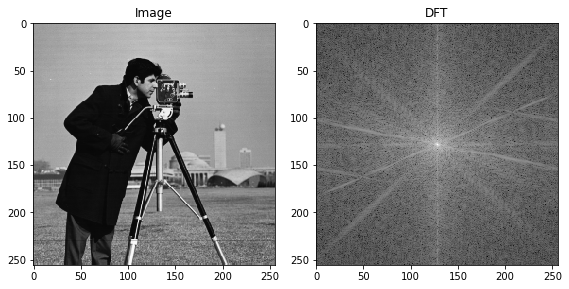

In [10]:
cm = imread("cameraman.png")
cm_fft = fftshow(fftshift(fft2(cm)))
matplot([cm, cm_fft], ["Image", "DFT"])

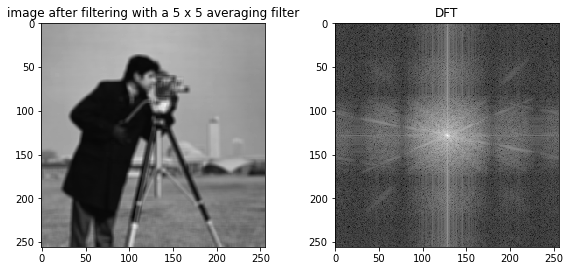

In [11]:
cm_average = uniform_filter(cm, 5)
cm_average_fft = fftshow(fftshift(fft2(cm_average)))
matplot([cm_average, cm_average_fft], ["image after filtering with a 5 x 5 averaging filter", "DFT"])

What happens if the averaging filter increases in size?

average filter的size越大，表示越多的pixel取平均，帶狀黑色的現象會變得更加頻繁。

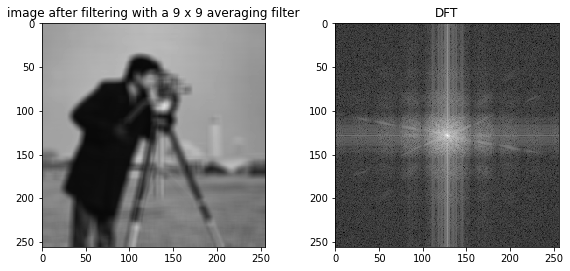

In [12]:
cm_average = uniform_filter(cm, 9)
cm_average_fft = fftshow(fftshift(fft2(cm_average)))
matplot([cm_average, cm_average_fft], ["image after filtering with a 9 x 9 averaging filter", "DFT"])

8\. What is the result of two DFTs performed in succession?  
Apply a DFT to an image, and then another DFT to the result. Can you account for what you see?

原影像上下顛倒，左右相反，而且在整體亮度上有提昇的效果。

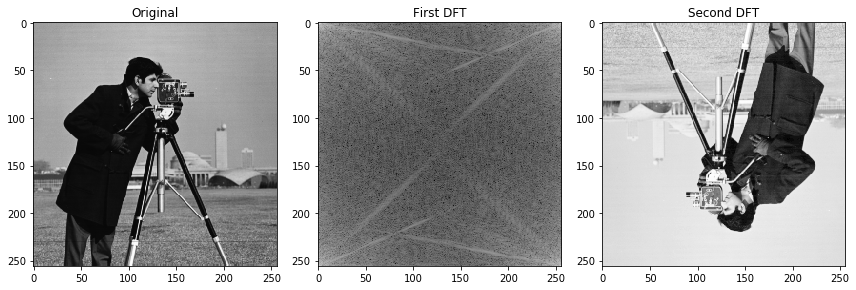

In [13]:
cm_fft_1 = fft2(cm)
cm_fft_2 = fft2(cm_fft_1)
matplot([cm, fftshow(cm_fft_1), fftshow(cm_fft_2)], ["Original", "First DFT", "Second DFT"])

9\. Open up the image `engineer.png`.  
Experiment with applying the Fourier Transformation to this image and the following filters:

(a) Ideal filters (both low and high pass)

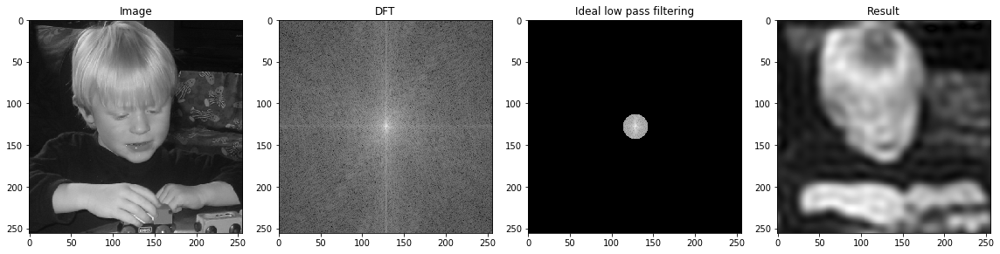

In [14]:
en = imread("engineer.png")
enf, c, enfcl, enfcia = fft_filter(en, "ideal", "low", 15)
matplot([en, enf, enfcl, enfcia], ["Image", "DFT", "Ideal low pass filtering", "Result"])

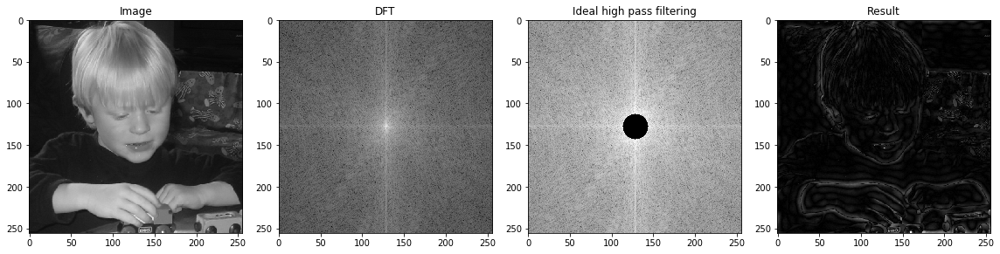

In [15]:
enf, c, enfcl, enfcia = fft_filter(en, "ideal", "high", 15)
matplot([en, enf, enfcl, enfcia], ["Image", "DFT", "Ideal high pass filtering", "Result"])

(b) Butterworth filters

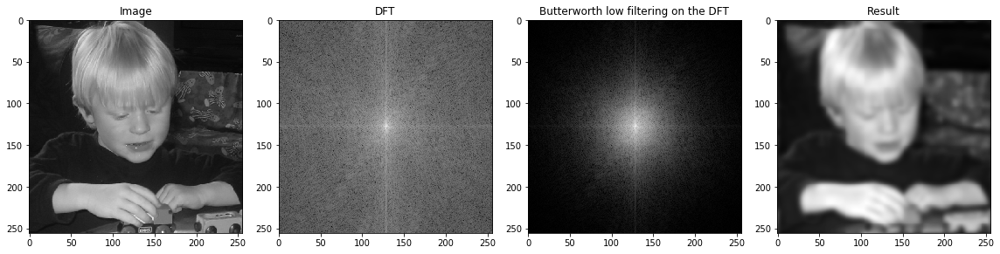

In [16]:
enf, c, enfcl, enfcia = fft_filter(en, "butterworth", "low", 15, 2)
matplot([en, enf, enfcl, enfcia], ["Image", "DFT", "Butterworth low filtering on the DFT", "Result"])

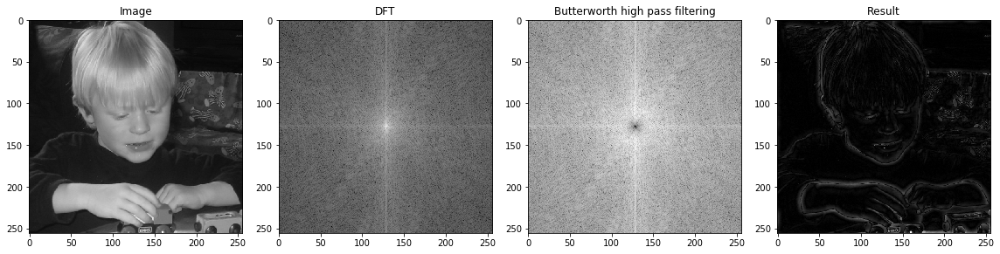

In [17]:
enf, c, enfcl, enfcia = fft_filter(en, "butterworth", "high", 15, 2)
matplot([en, enf, enfcl, enfcia], ["Image", "DFT", "Butterworth high pass filtering", "Result"])

(c) Gaussian filters

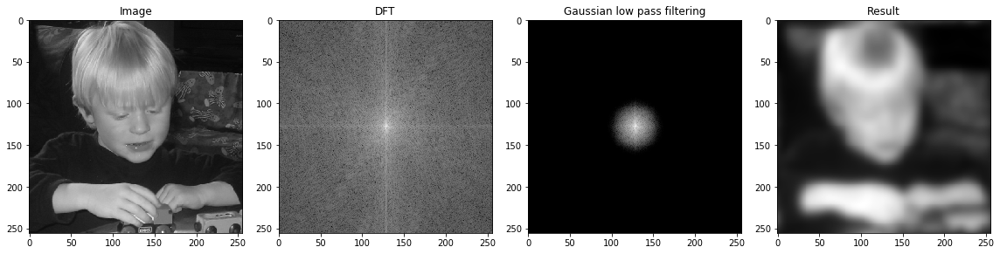

In [18]:
enf, c, enfcl, enfcia = fft_filter(en, "gaussian", "low", sigma=10)
matplot([en, enf, enfcl, enfcia], ["Image", "DFT", "Gaussian low pass filtering", "Result"])

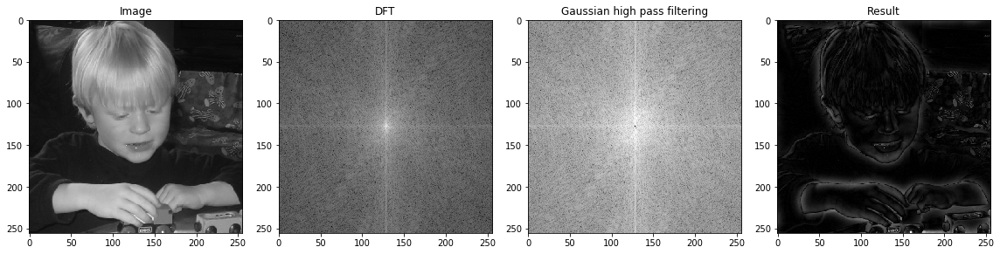

In [19]:
enf, c, enfcl, enfcia = fft_filter(en, "gaussian", "high", sigma=10)
matplot([en, enf, enfcl, enfcia], ["Image", "DFT", "Gaussian high pass filtering", "Result"])

What is the smallest redius of a low pass ideal filter for which the face is still recognizable?

redius = 13

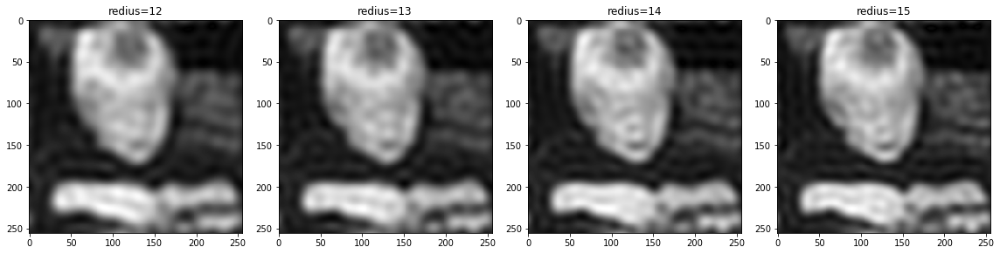

In [20]:
enf1, c, enfcl1, enfcia1 = fft_filter(en, "ideal", "low", 12)
enf2, c, enfcl2, enfcia2 = fft_filter(en, "ideal", "low", 13)
enf3, c, enfcl3, enfcia3 = fft_filter(en, "ideal", "low", 14)
enf4, c, enfcl4, enfcia4 = fft_filter(en, "ideal", "low", 15)
matplot([enfcia1, enfcia2, enfcia3, enfcia4], ["redius=12", "redius=13", "redius=14", "redius=15"])

10\. If you have access to a digital camera, or a scanner, produce a digital image of the face of somebody you know, and perform the same calculations as in the previous question.

(a) Ideal filters

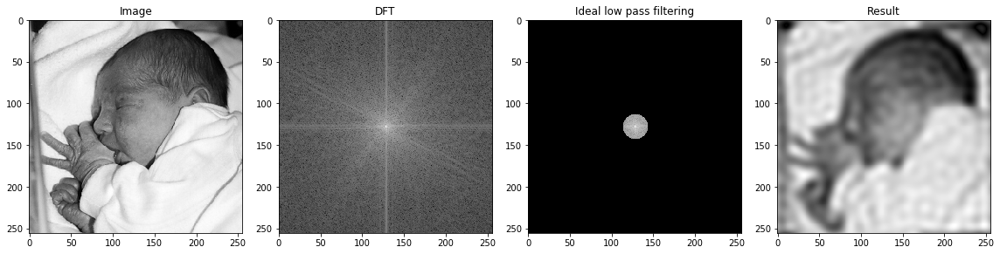

In [21]:
nb = imread("newborn.png")
nbf, c, nbfcl, nbfcia = fft_filter(nb, "ideal", "low", 15)
matplot([nb, nbf, nbfcl, nbfcia], ["Image", "DFT", "Ideal low pass filtering", "Result"])

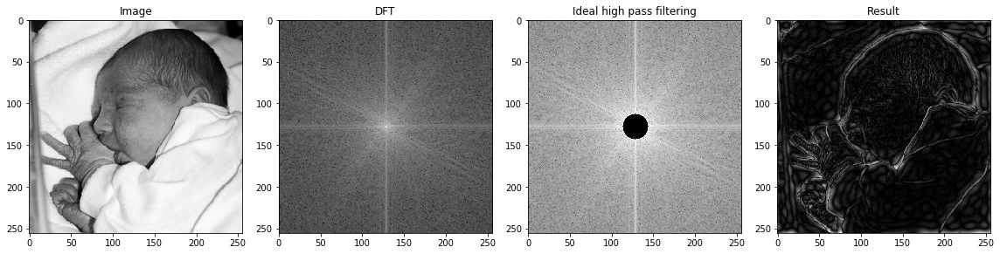

In [22]:
nbf, c, nbfcl, nbfcia = fft_filter(nb, "ideal", "high", 15)
matplot([nb, nbf, nbfcl, nbfcia], ["Image", "DFT", "Ideal high pass filtering", "Result"])

(b) Butterworth filters

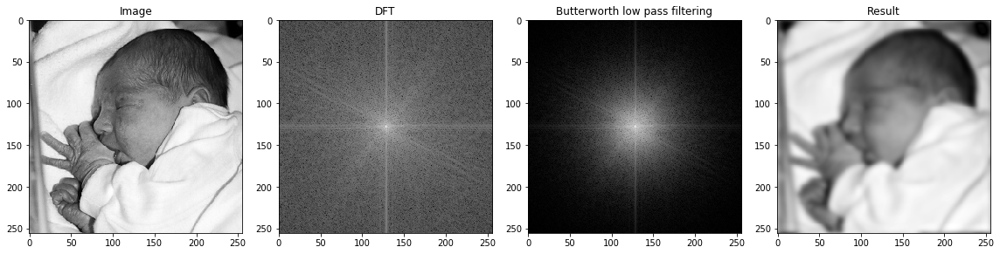

In [23]:
nbf, c, nbfcl, nbfcia = fft_filter(nb, "butterworth", "low", 15, 2)
matplot([nb, nbf, nbfcl, nbfcia], ["Image", "DFT", "Butterworth low pass filtering", "Result"])

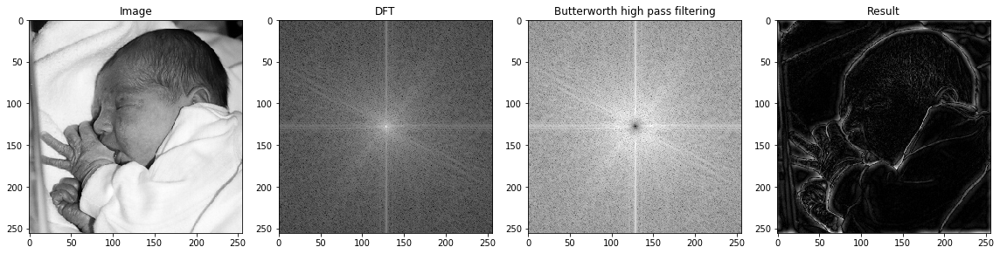

In [24]:
nbf, c, nbfcl, nbfcia = fft_filter(nb, "butterworth", "high", 15, 2)
matplot([nb, nbf, nbfcl, nbfcia], ["Image", "DFT", "Butterworth high pass filtering", "Result"])

(c) Gaussian filters

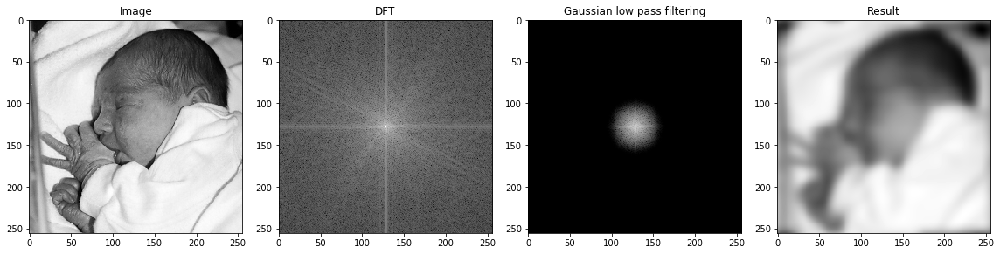

In [25]:
nbf, c, nbfcl, nbfcia = fft_filter(nb, "gaussian", "low", sigma=10)
matplot([nb, nbf, nbfcl, nbfcia], ["Image", "DFT", "Gaussian low pass filtering", "Result"])

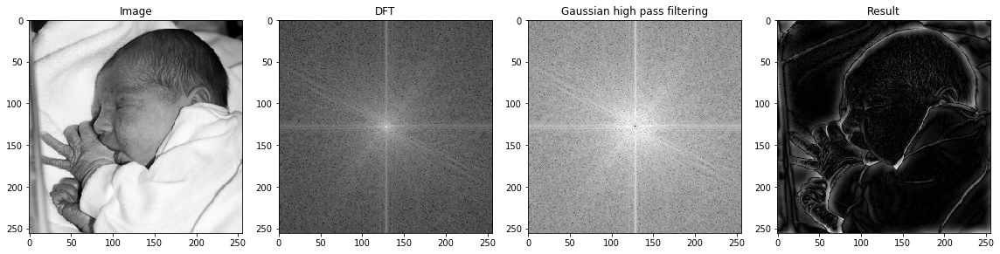

In [26]:
nbf, c, nbfcl, nbfcia = fft_filter(nb, "gaussian", "high", sigma=10)
matplot([nb, nbf, nbfcl, nbfcia], ["Image", "DFT", "Gaussian high pass filtering", "Result"])

What is the smallest redius of a low pass ideal filter for which the face is still recognizable?

redius = 13

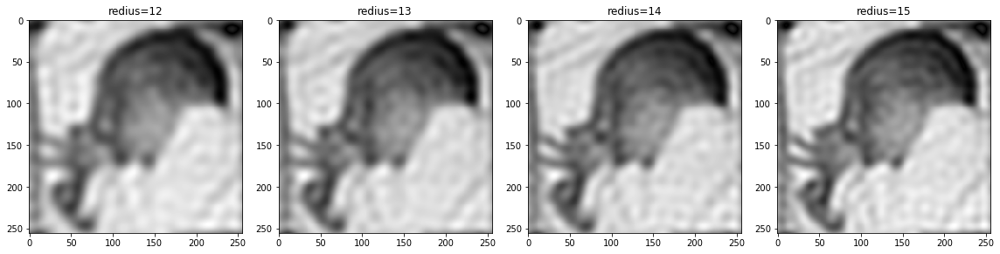

In [27]:
nbf1, c, nbfcl1, nbfcia1 = fft_filter(nb, "ideal", "low", 12)
nbf2, c, nbfcl2, nbfcia2 = fft_filter(nb, "ideal", "low", 13)
nbf3, c, nbfcl3, nbfcia3 = fft_filter(nb, "ideal", "low", 14)
nbf4, c, nbfcl4, nbfcia4 = fft_filter(nb, "ideal", "low", 15)
matplot([nbfcia1, nbfcia2, nbfcia3, nbfcia4], ["redius=12", "redius=13", "redius=14", "redius=15"])

## Chapter 8 Exercises

1\. The following arrays represent small grayscale images.  
Compute the 4 x 4 image that would result in each case if the middle 16 pixels were transformed using a 3 x 3 median filter.

(a)
```
 8  17   4  10  15  12
10  12  15   7   3  10
15  10  50   5   3  12
 4   8  11   4   1   8
16   7   4   3   0   7
16  24  19   3  20  10
```

In [28]:
a = array([[8, 17, 4, 10, 15, 12], 
           [10, 12, 15, 7, 3, 10], 
           [15, 10, 50, 5, 3, 12], 
           [4, 8, 11, 4, 1, 8], 
           [16, 7, 4, 3, 0, 7], 
           [16, 24, 19, 3, 20, 10]])
median_filter(a, 3)[1:5, 1:5]

array([[12, 10,  7, 10],
       [11, 10,  5,  5],
       [10,  7,  4,  4],
       [11,  7,  4,  4]])

(b)
```
 1   1   2   5   3   1
 3  20   5   6   4   6
 4   6   4  20   2   2
 4   3   3   5   1   5
 6   5  20   2  20   2
 6   3   1   4   1   2
```

In [29]:
b = array([[1, 1, 2, 5, 3, 1], 
           [3, 20, 5, 6, 4, 6], 
           [4, 6, 4, 20, 2, 2], 
           [4, 3, 3, 5, 1, 5], 
           [6, 5, 20, 2, 20, 2], 
           [6, 3, 1, 4, 1, 2]])
median_filter(b, 3)[1:5, 1:5]

array([[4, 5, 4, 4],
       [4, 5, 4, 5],
       [4, 5, 4, 2],
       [4, 3, 3, 2]])

(c)
```
 7   8  11  12  13   9
 8  14   0   9   7  10
11  23  10  14   1   8
14   7  11   8   9  11
13  13  18  10   7  12
 9  11  14  12  13  10
```

In [30]:
c = array([[7, 8, 11, 12, 13, 9], 
           [8, 14, 0, 9, 7, 10], 
           [11, 23, 10, 14, 1, 8], 
           [14, 7, 11, 8, 9, 11],
           [13, 13, 18, 10, 7, 12], 
           [9, 11, 14, 12, 13, 10]])
median_filter(c, 3)[1:5, 1:5]

array([[10, 11, 10,  9],
       [11, 10,  9,  9],
       [13, 11, 10,  9],
       [13, 11, 11, 10]])

2\. Using the same image as in Question 1, transform them by using a 3 x 3 averaging filter.

(a)

In [31]:
uniform_filter(a, 3)[1:5, 1:5]

array([[15, 14, 12,  8],
       [14, 13, 10,  5],
       [13, 11,  8,  4],
       [12,  9,  7,  6]])

(b)

In [32]:
uniform_filter(b, 3)[1:5, 1:5]

array([[4, 7, 5, 5],
       [5, 7, 5, 5],
       [5, 7, 8, 6],
       [5, 4, 6, 4]])

(c)

In [33]:
uniform_filter(c, 3)[1:5, 1:5]

array([[10, 11,  8,  9],
       [10, 10,  7,  8],
       [13, 12,  9,  8],
       [12, 11, 11, 10]])

3\. Use the outlier method to find noisy pixels in each of the images given in Question 1.  
What are the reasonable values to use for the difference between the gray value of a pizel and the average of its eight 8-neighbors?

In [34]:
av = array([[1, 1, 1], 
            [1, 0, 1], 
            [1, 1, 1]]) / 8

(a) threshold value D 取 7, noisy pixel -> (2, 2) = 41

In [35]:
a_av = convolve(a, av)
abs(a - a_av)[1:5, 1:5]

array([[ 4,  1,  6,  6],
       [ 5, 41,  6,  3],
       [ 6,  0,  5,  4],
       [ 5,  5,  4,  7]])

(b) threshold value D 取 6, noisy pixel -> (1, 1) = 17, (2, 3) = 17, (4, 2) = 17, (4, 4) = 18

In [36]:
b_av = convolve(b, av)
abs(b - b_av)[1:5, 1:5]

array([[17,  3,  1,  1],
       [ 1,  4, 17,  4],
       [ 3,  5,  4,  6],
       [ 0, 17,  4, 18]])

(c) threshold value D 取 8, noisy pixel -> (1, 2) = 12, (2, 1) = 14

In [37]:
c_av = convolve(c, av)
abs(c - c_av)[1:5, 1:5]

array([[ 5, 12,  1,  2],
       [14,  0,  8,  8],
       [ 7,  1,  2,  1],
       [ 1,  8,  1,  3]])

6\. Choose any grayscale image of your choice and add 5% salt and pepper noise to the image. Attempt to remove the noise with

In [38]:
g = rgb2gray(imread("gull.png"))
gsp = random_noise(g, "s&p", amount=0.05)

(a) Average filtering

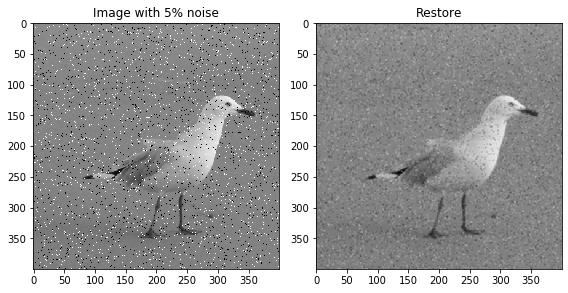

In [39]:
gsp_average = uniform_filter(gsp, 3)
matplot([gsp, gsp_average], ["Image with 5% noise", "Restore"])

(b) Median filtering

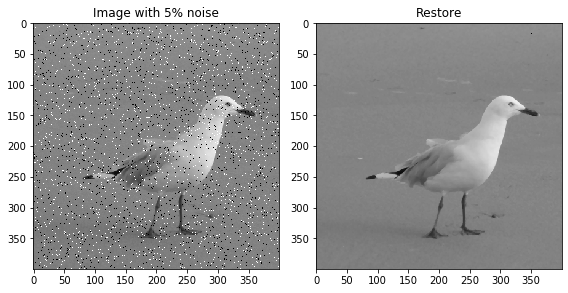

In [40]:
gsp_median = median_filter(gsp, 3)
matplot([gsp, gsp_median], ["Image with 5% noise", "Restore"])

(c) The outlier method

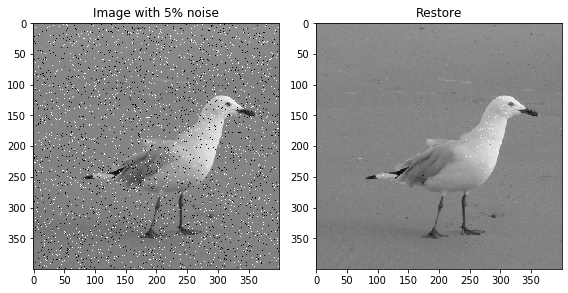

In [41]:
gsp_outlier = outlier_filter(gsp, 0.3)
matplot([gsp, gsp_outlier], ["Image with 5% noise", "Restore"])

(d) Pseudo-median filtering

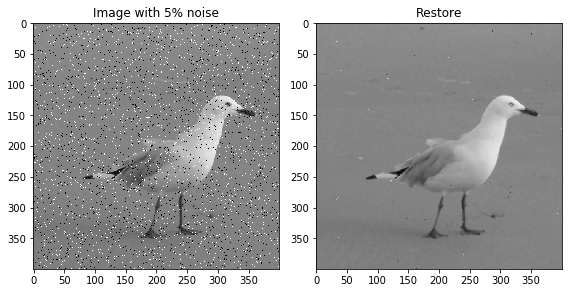

In [43]:
gsp_pseudo = generic_filter(gsp, pseudo_median, size=(3, 3))
matplot([gsp, gsp_pseudo], ["Image with 5% noise", "Restore"])

Which method gives the best results?

Median filtering

7\. Repeat the above question but with 10%, and then with 20% noise.

In [44]:
gsp2 = random_noise(g, "s&p", amount=0.1)
gsp3 = random_noise(g, "s&p", amount=0.2)

(a) Average filtering

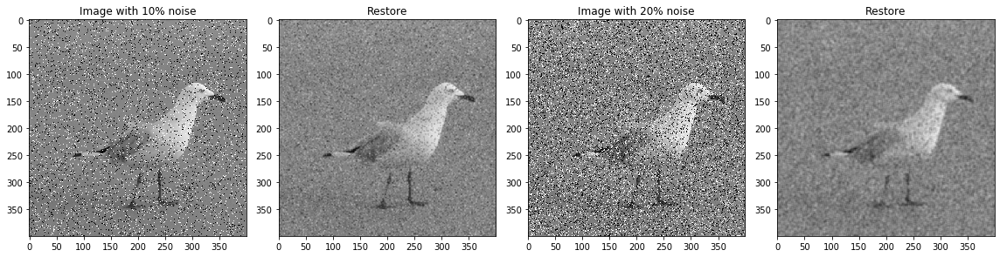

In [45]:
gsp2_average = uniform_filter(gsp2, 3)
gsp3_average = uniform_filter(gsp3, 5)
matplot([gsp2, gsp2_average, gsp3, gsp3_average], 
        ["Image with 10% noise", "Restore", "Image with 20% noise", "Restore"])

(b) Median filtering

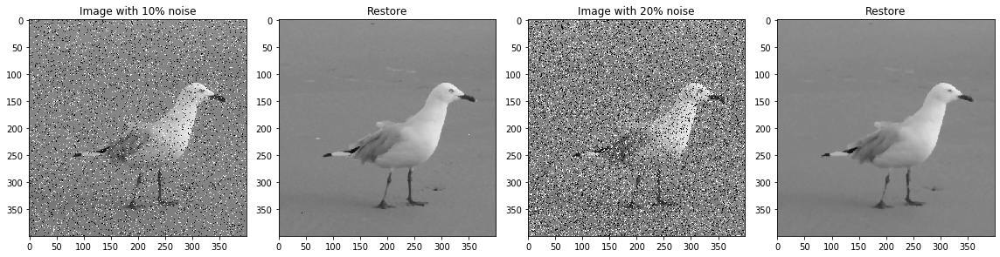

In [46]:
gsp2_median = median_filter(gsp2, 3)
gsp3_median = median_filter(gsp3, 5)
matplot([gsp2, gsp2_median, gsp3, gsp3_median], 
        ["Image with 10% noise", "Restore", "Image with 20% noise", "Restore"])

(c) The outlier method

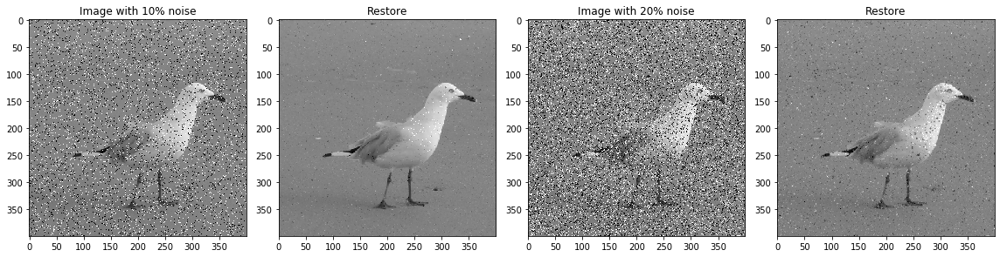

In [47]:
gsp2_outlier = outlier_filter(gsp2, 0.3)
gsp3_outlier = outlier_filter(gsp3, 0.25)
matplot([gsp2, gsp2_outlier, gsp3, gsp3_outlier], 
        ["Image with 10% noise", "Restore", "Image with 20% noise", "Restore"])

(d) Pseudo-median filtering

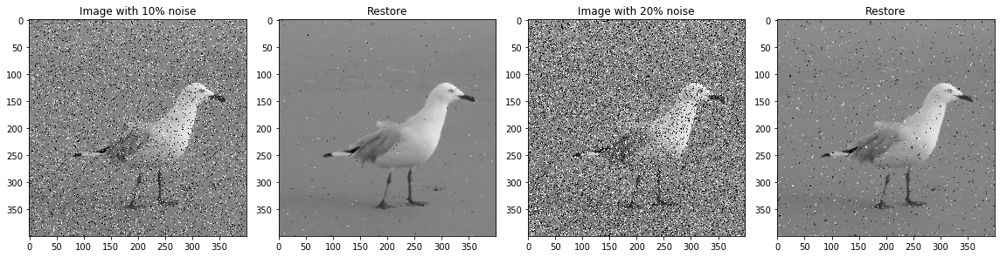

In [48]:
gsp2_pseudo = generic_filter(gsp2, pseudo_median, size=(3, 3))
gsp3_pseudo = generic_filter(gsp3, pseudo_median, size=(3, 3))
matplot([gsp2, gsp2_pseudo, gsp3, gsp3_pseudo], 
        ["Image with 10% noise", "Restore", "Image with 20% noise", "Restore"])

Which method gives the best results?

Median filtering

8\. For 20% noise, compare the results with a 5 x 5 median filter, and two applications of a 3 x 3 median filter.

兩者相比之下，5x5 median filter的結果比連續兩次3x3 median filter還要來的模糊。

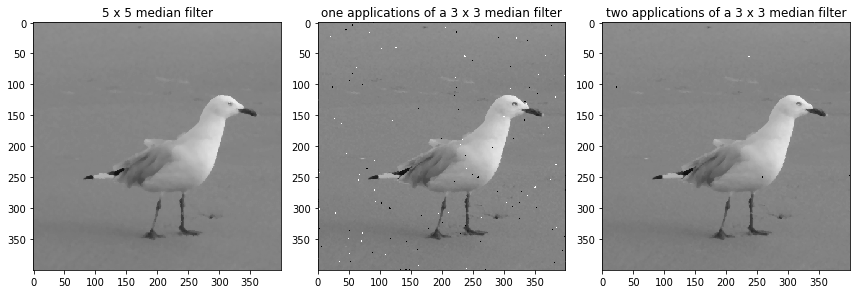

In [49]:
gsp3_median1 = median_filter(gsp3, 3)
gsp3_median2 = median_filter(gsp3_median1, 3)
matplot([gsp3_median, gsp3_median1, gsp3_median2], ["5 x 5 median filter", 
                                                    "one applications of a 3 x 3 median filter",
                                                    "two applications of a 3 x 3 median filter"])

9\. Add Gaussian noise to your chosen image with the following parameters:  
In each case, attempt to remove the noise with average filtering and with Wiener filtering.  
Can you produce satisfactory results with the last two noisy images?

(a) Mean 0, variance 0.01 (the default)

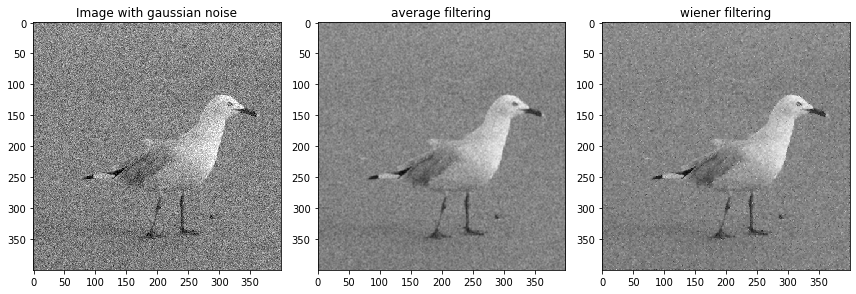

In [50]:
gg = random_noise(g, "gaussian", mean=0, var=0.01)
gg_average = uniform_filter(gg, 3)
gg_wiener = wiener(gg, 3)
matplot([gg, gg_average, gg_wiener], ["Image with gaussian noise", "average filtering", "wiener filtering"])

(b) Mean 0, variance 0.02

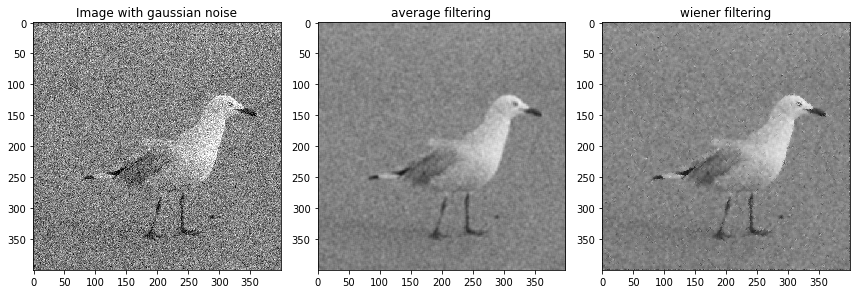

In [51]:
gg = random_noise(g, "gaussian", mean=0, var=0.02)
gg_average = uniform_filter(gg, 5)
gg_wiener = wiener(gg, 5)
matplot([gg, gg_average, gg_wiener], ["Image with gaussian noise", "average filtering", "wiener filtering"])

(c) Mean 0, variance 0.05

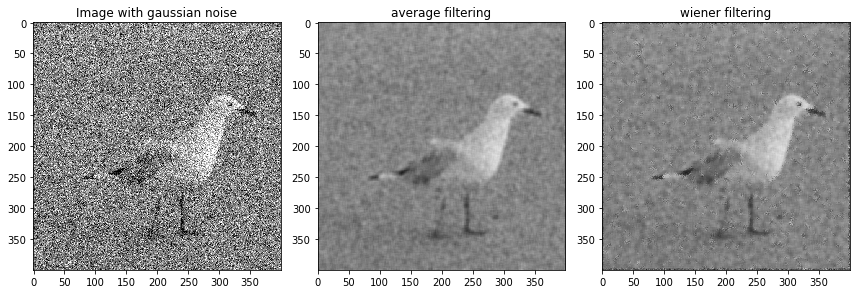

In [52]:
gg = random_noise(g, "gaussian", mean=0, var=0.05)
gg_average = uniform_filter(gg, 7)
gg_wiener = wiener(gg, 7)
matplot([gg, gg_average, gg_wiener], ["Image with gaussian noise", "average filtering", "wiener filtering"])

(d) Mean 0, variance 0.1

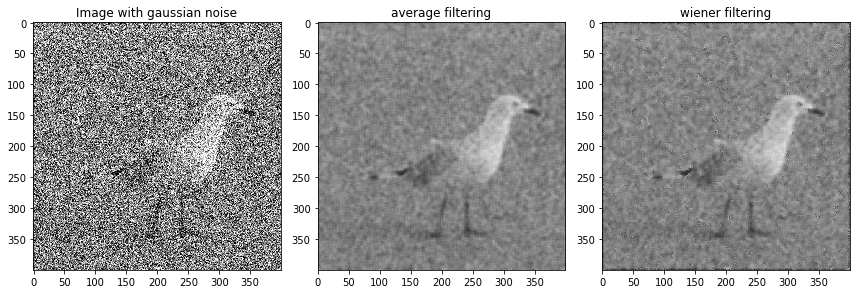

In [53]:
gg = random_noise(g, "gaussian", mean=0, var=0.1)
gg_average = uniform_filter(gg, 7)
gg_wiener = wiener(gg, 7)
matplot([gg, gg_average, gg_wiener], ["Image with gaussian noise", "average filtering", "wiener filtering"])

13\. For each of the following sine commands:  
add the sine wave to the image as shown in the previous question, and attempt to remove the resulting periodic noise using band-reject filtering or notch filtering.

In [54]:
r, c = g.shape
x, y = np.mgrid[0:r, 0:c].astype(float64)

(a) s = 1+sin(x/3+y/5)

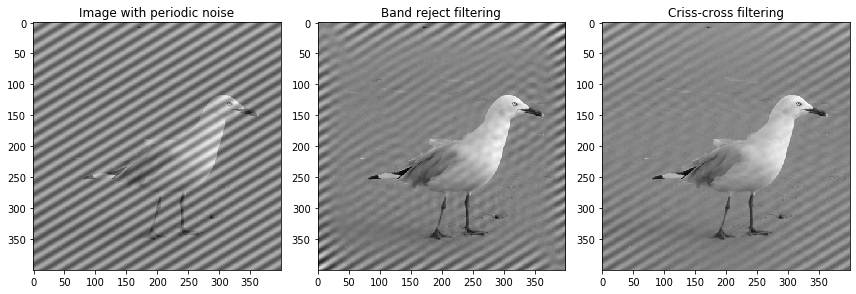

In [55]:
s = 1 + np.sin(x / 3 + y / 5)
gpa = periodic_noise(g, s)
gpaf, gpafc, gpafci = periodic_filter(gpa, "band", 1)
gpaf2, gpafc2, gpafci2 = periodic_filter(gpa, "criss")
matplot([gpa, gpafci, gpafci2], ["Image with periodic noise", "Band reject filtering", "Criss-cross filtering"])

(b) s = 1+sin(x/5+y/1.5)

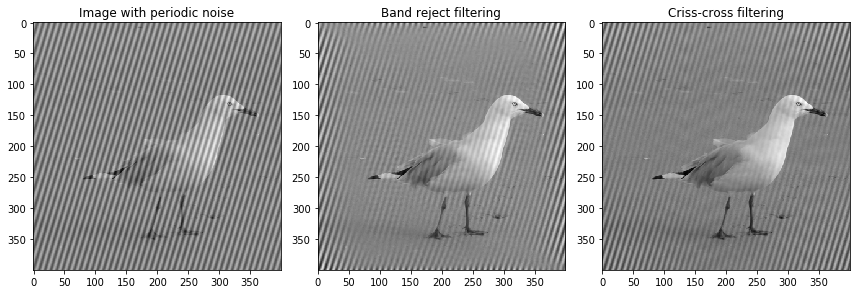

In [56]:
s = 1 + np.sin(x / 5 + y / 1.5)
gpa = periodic_noise(g, s)
gpaf, gpafc, gpafci = periodic_filter(gpa, "band", 1)
gpaf2, gpafc2, gpafci2 = periodic_filter(gpa, "criss")
matplot([gpa, gpafci, gpafci2], ["Image with periodic noise", "Band reject filtering", "Criss-cross filtering"])

(c) s = 1+sin(x/6+y/6)

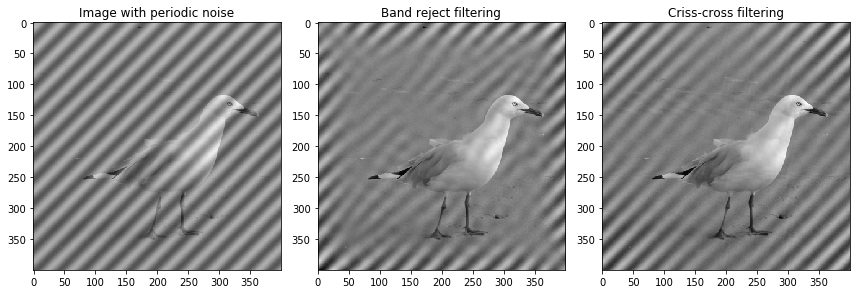

In [57]:
s = 1 + np.sin(x / 6 + y / 6)
gpa = periodic_noise(g, s)
gpaf, gpafc, gpafci = periodic_filter(gpa, "band", 1)
gpaf2, gpafc2, gpafci2 = periodic_filter(gpa, "criss")
matplot([gpa, gpafci, gpafci2], ["Image with periodic noise", "Band reject filtering", "Criss-cross filtering"])

Which of the three is easiest to "clean up"?

s = 1+sin(x/3+y/5)

14\. Apply a 5 x 5 blurring filter to a grayscale image of your choice. Attempt to deblur the result using inverse filtering with constrained division. Which threshold gives the best results?

threshold = 0.1 gives the best results.

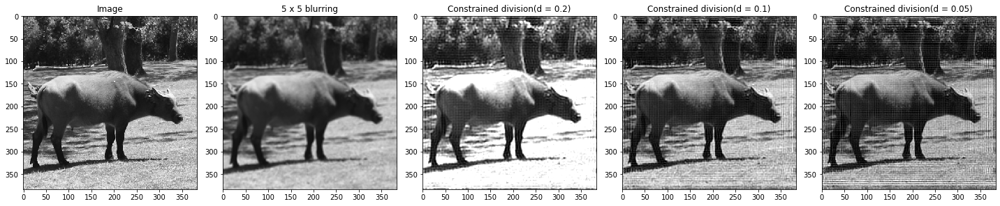

In [58]:
b = imread("buffalo.png")
m = ones((5, 5)) / 25
ba = convolve(b, m)
bad1 = deblur(ba, m, "con", 0.2)
bad2 = deblur(ba, m, "con", 0.1)
bad3 = deblur(ba, m, "con", 0.05)
matplot([b, ba, bad1, bad2, bad3], ["Image", "5 x 5 blurring", 
                                    "Constrained division(d = 0.2)", 
                                    "Constrained division(d = 0.1)", 
                                    "Constrained division(d = 0.05)"])

15\. Repeat the previous question using a 7 x 7 blurring filter.

threshold = 0.2 gives the best results.

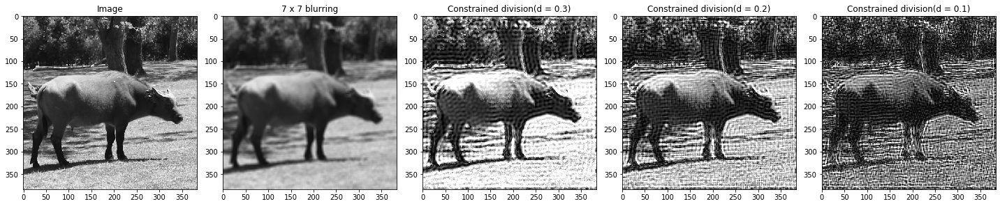

In [59]:
m = ones((7, 7)) / 49
ba = convolve(b, m)
bad1 = deblur(b, m, "con", 0.3)
bad2 = deblur(b, m, "con", 0.2)
bad3 = deblur(b, m, "con", 0.1)
matplot([b, ba, bad1, bad2, bad3], ["Image", "7 x 7 blurring", 
                                    "Constrained division(d = 0.3)", 
                                    "Constrained division(d = 0.2)", 
                                    "Constrained division(d = 0.1)"])